In [ ]:
#!conda install pandas-profiling -y

In [13]:
%load_ext nb_black

import pandas as pd
import seaborn as sns
import pandas_profiling as pp

pd.options.display.max_columns = 26

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

In [2]:
df_carros = pd.read_csv("arquivos/carros - carros.csv")
df_carros.head()

,riskiness,losses,make,fuel type,city mpg,highway mpg,aspiration,doors,body,drive,engine location,wheel base,length,width,height,weight,engine type,cylinders,engine size,fuel system,bore,stroke,compression ratio,horsepower,peak rpm,price
0,2,164.0,audi,gas,24.0,30.0,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.4,10.0,102,5500,13950
1,2,164.0,audi,gas,18.0,22.0,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.4,8.0,115,5500,17450
2,1,158.0,audi,gas,19.0,25.0,std,four,sedan,fwd,front,105.8,192.7,71.4,55.7,2844,ohc,five,136,mpfi,3.19,3.4,8.5,110,5500,17710
3,1,158.0,audi,gas,17.0,20.0,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.4,8.3,140,5500,23875
4,2,192.0,bmw,gas,23.0,29.0,std,two,sedan,rwd,front,101.2,176.8,64.8,54.3,2395,ohc,four,108,mpfi,3.50,2.8,8.8,101,5800,16430


<IPython.core.display.Javascript object>

In [3]:
df_carros.describe().T.reset_index()

,index,count,mean,std,min,25%,50%,75%,max
0,riskiness,165.0,0.739394,1.183716,-2.00,0.00,1.00,2.00,3.00
1,losses,159.0,122.566038,36.905889,65.00,94.00,115.00,151.50,256.00
2,city mpg,164.0,26.408537,6.234491,15.00,22.75,26.00,31.00,49.00
3,highway mpg,159.0,32.088050,6.723644,18.00,28.00,32.00,37.00,54.00
4,wheel base,165.0,98.321212,5.183802,86.60,94.50,97.00,101.20,115.60
5,length,165.0,172.453333,11.699643,141.10,165.70,172.40,177.80,202.60
6,width,165.0,65.590909,2.011819,60.30,64.00,65.40,66.50,71.70
7,height,165.0,53.916970,2.233821,49.40,52.50,54.10,55.50,59.80
8,weight,165.0,2461.575758,482.616638,1488.00,2081.00,2370.00,2808.00,4066.00
9,engine size,165.0,119.351515,30.682244,61.00,97.00,110.00,136.00,258.00


<IPython.core.display.Javascript object>

In [4]:
df_carros.describe(include="O").T.reset_index()

,index,count,unique,top,freq
0,make,165,18,toyota,31
1,fuel type,165,2,gas,150
2,aspiration,165,2,std,137
3,doors,165,2,four,98
4,body,165,5,sedan,84
5,drive,165,3,fwd,107
6,engine location,165,1,front,165
7,engine type,165,5,ohc,128
8,cylinders,165,5,four,138
9,fuel system,165,6,mpfi,69


<IPython.core.display.Javascript object>

In [5]:
df_na = df_carros.isnull().sum()
df_na
df_na.loc[df_na > 0]

losses         6
city mpg       1
highway mpg    6
dtype: int64

<IPython.core.display.Javascript object>

In [ ]:
df_na.loc[df_na > 0]

In [12]:
df_na2 = df_carros.isnull().mean()
df_na2.loc[df_na2 > 0]

losses         0.036364
city mpg       0.006061
highway mpg    0.036364
dtype: float64

<IPython.core.display.Javascript object>

In [6]:
colunas_com_na = df_na.loc[df_na > 0].index.tolist()
colunas_com_na

['losses', 'city mpg', 'highway mpg']

<IPython.core.display.Javascript object>

In [7]:
df_carros.loc[:, colunas_com_na].describe()

,losses,city mpg,highway mpg
count,159.000000,164.000000,159.000000
mean,122.566038,26.408537,32.088050
std,36.905889,6.234491,6.723644
min,65.000000,15.000000,18.000000
25%,94.000000,22.750000,28.000000
50%,115.000000,26.000000,32.000000
75%,151.500000,31.000000,37.000000
max,256.000000,49.000000,54.000000


<IPython.core.display.Javascript object>

In [8]:
df_carros.loc[
    df_carros.isna().any(axis=1),
]

,riskiness,losses,make,fuel type,city mpg,highway mpg,aspiration,doors,body,drive,engine location,wheel base,length,width,height,weight,engine type,cylinders,engine size,fuel system,bore,stroke,compression ratio,horsepower,peak rpm,price
5,0,NaN,bmw,gas,23.0,29.0,std,four,sedan,rwd,front,101.2,176.8,64.8,54.3,2395,ohc,four,108,mpfi,3.50,2.80,8.80,101,5800,16925
11,1,NaN,dodge,gas,37.0,41.0,std,two,hatchback,fwd,front,93.7,157.3,63.8,50.8,1876,ohc,four,90,2bbl,2.97,3.23,9.41,68,5500,5572
20,2,NaN,honda,gas,31.0,38.0,std,two,hatchback,fwd,front,86.6,144.6,63.9,50.8,1819,ohc,four,92,1bbl,2.91,3.41,9.20,76,6000,6855
27,0,NaN,honda,gas,27.0,33.0,std,two,hatchback,fwd,front,96.5,167.5,65.2,53.3,2289,ohc,four,110,1bbl,3.15,3.58,9.00,86,5800,9095
38,1,NaN,mazda,gas,26.0,32.0,std,two,hatchback,fwd,front,98.8,177.8,66.5,53.7,2385,ohc,four,122,2bbl,3.39,3.39,8.60,84,4800,8845
40,1,NaN,mazda,gas,26.0,32.0,std,two,hatchback,fwd,front,98.8,177.8,66.5,53.7,2385,ohc,four,122,2bbl,3.39,3.39,8.60,84,4800,10595
96,2,104.0,saab,gas,19.0,NaN,turbo,four,sedan,fwd,front,99.1,186.6,66.5,56.1,2847,dohc,four,121,mpfi,3.54,3.07,9.00,160,5500,18620
98,2,83.0,subaru,gas,26.0,NaN,std,two,hatchback,fwd,front,93.7,157.9,63.6,53.7,2120,ohcf,four,108,2bbl,3.62,2.64,8.70,73,4400,7053
104,0,102.0,subaru,gas,24.0,NaN,turbo,four,sedan,4wd,front,97.0,172.0,65.4,54.3,2510,ohcf,four,108,mpfi,3.62,2.64,7.70,111,4800,11259
107,0,85.0,subaru,gas,23.0,NaN,std,four,wagon,4wd,front,96.9,173.6,65.4,54.9,2420,ohcf,four,108,2bbl,3.62,2.64,9.00,82,4800,8013


<IPython.core.display.Javascript object>

In [9]:
df_carros.isna().any(axis=1)

0      False
1      False
2      False
3      False
4      False
       ...  
160    False
161    False
162    False
163    False
164    False
Length: 165, dtype: bool

<IPython.core.display.Javascript object>

In [10]:
df_carros.loc[df_carros.duplicated()]

,riskiness,losses,make,fuel type,city mpg,highway mpg,aspiration,doors,body,drive,engine location,wheel base,length,width,height,weight,engine type,cylinders,engine size,fuel system,bore,stroke,compression ratio,horsepower,peak rpm,price
159,1,158.0,audi,gas,17.0,20.0,turbo,four,sedan,fwd,front,105.8,192.7,71.4,55.9,3086,ohc,five,131,mpfi,3.13,3.40,8.3,140,5500,23875
160,2,192.0,bmw,gas,23.0,29.0,std,two,sedan,rwd,front,101.2,176.8,64.8,54.3,2395,ohc,four,108,mpfi,3.50,2.80,8.8,101,5800,16430
162,0,188.0,bmw,gas,21.0,28.0,std,two,sedan,rwd,front,101.2,176.8,64.8,54.3,2710,ohc,six,164,mpfi,3.31,3.19,9.0,121,4250,20970
163,0,188.0,bmw,gas,21.0,28.0,std,four,sedan,rwd,front,101.2,176.8,64.8,54.3,2765,ohc,six,164,mpfi,3.31,3.19,9.0,121,4250,21105
164,2,121.0,chevrolet,gas,47.0,53.0,std,two,hatchback,fwd,front,88.4,141.1,60.3,53.2,1488,l,three,61,2bbl,2.91,3.03,9.5,48,5100,5151


<IPython.core.display.Javascript object>

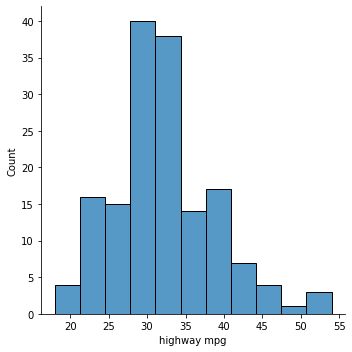

<IPython.core.display.Javascript object>

In [17]:
sns.displot(df_carros["highway mpg"], kde=False)

In [ ]:
sns.set(rc={"figure.figsize": (11.7, 8.27)})
sns.displot(df_carros["highway mpg"], kde=False)

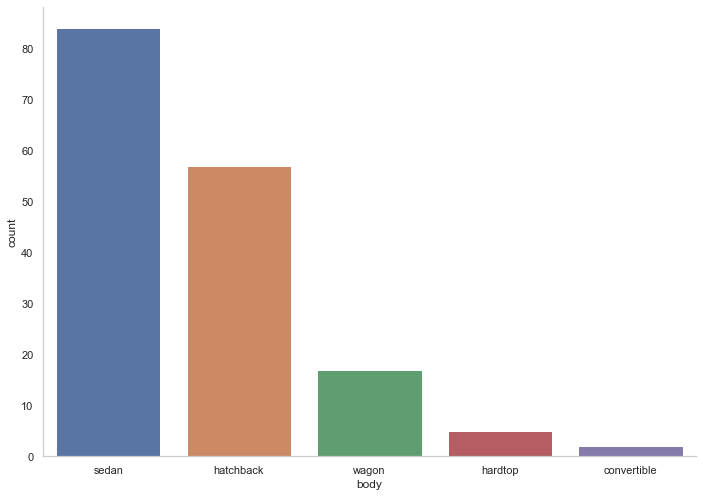

<IPython.core.display.Javascript object>

In [50]:
sns.countplot(x=df_carros["body"])

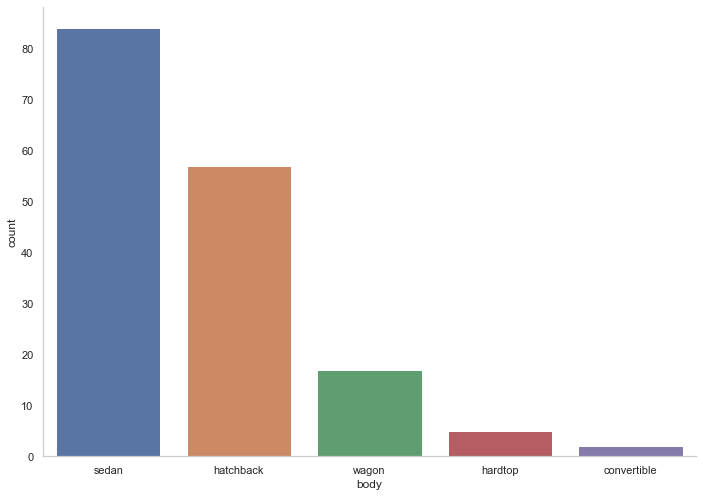

<IPython.core.display.Javascript object>

In [51]:
sns.set_style("whitegrid", {"axes.grid": False})
sns.countplot(x=df_carros["body"])
sns.despine()

In [20]:
df_carros["highway mpg"].mean()

32.088050314465406

<IPython.core.display.Javascript object>

In [21]:
df_carros["horsepower"].mean()

96.18181818181819

<IPython.core.display.Javascript object>

In [23]:
df_carros["highway mpg"].median()

32.0

<IPython.core.display.Javascript object>

In [25]:
df_carros["highway mpg"].std()

6.723643948546022

<IPython.core.display.Javascript object>

In [22]:
df_carros["horsepower"].median()

90.0

<IPython.core.display.Javascript object>

In [24]:
df_carros["doors"].mode()

0    four
dtype: object

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='highway mpg'>

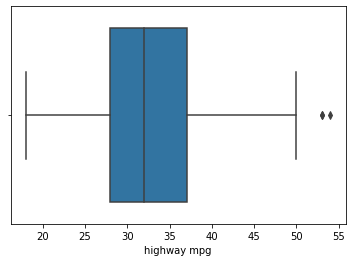

<IPython.core.display.Javascript object>

In [28]:
sns.boxplot(x=df_carros["highway mpg"])

In [29]:
df_carros.corr(method="spearman")

,riskiness,losses,city mpg,highway mpg,wheel base,length,width,height,weight,engine size,bore,stroke,compression ratio,horsepower,peak rpm,price
riskiness,1.000000,0.494374,0.126073,0.196115,-0.479724,-0.366699,-0.225682,-0.436753,-0.305669,-0.233506,-0.283094,-0.010205,0.062526,-0.125754,0.231712,-0.243484
losses,0.494374,1.000000,-0.251043,-0.213648,-0.048240,0.070801,0.104003,-0.339466,0.108139,0.154345,-0.048560,0.072485,-0.075144,0.253534,0.254615,0.212998
city mpg,0.126073,-0.251043,1.000000,0.972158,-0.654656,-0.770510,-0.723261,-0.255227,-0.850487,-0.806259,-0.627357,-0.039716,0.485433,-0.917475,-0.052732,-0.861034
highway mpg,0.196115,-0.213648,0.972158,1.000000,-0.672092,-0.781244,-0.731902,-0.282593,-0.859820,-0.796668,-0.641613,-0.030970,0.429032,-0.905311,-0.013580,-0.863373
wheel base,-0.479724,-0.048240,-0.654656,-0.672092,1.000000,0.920168,0.804635,0.620950,0.824864,0.765664,0.629107,0.188530,-0.112013,0.653142,-0.231571,0.802653
length,-0.366699,0.070801,-0.770510,-0.781244,0.920168,1.000000,0.868829,0.538396,0.906376,0.840788,0.683566,0.144547,-0.173429,0.754161,-0.194514,0.877784
width,-0.225682,0.104003,-0.723261,-0.731902,0.804635,0.868829,1.000000,0.365558,0.850689,0.835197,0.631996,0.247995,-0.129107,0.741441,-0.177735,0.818687
height,-0.436753,-0.339466,-0.255227,-0.282593,0.620950,0.538396,0.365558,1.000000,0.433291,0.267910,0.298764,-0.052965,0.002247,0.150567,-0.216011,0.369583
weight,-0.305669,0.108139,-0.850487,-0.859820,0.824864,0.906376,0.850689,0.433291,1.000000,0.904537,0.706952,0.167497,-0.226285,0.828153,-0.233056,0.920259
engine size,-0.233506,0.154345,-0.806259,-0.796668,0.765664,0.840788,0.835197,0.267910,0.904537,1.000000,0.716099,0.340883,-0.211132,0.851982,-0.285478,0.861032


<IPython.core.display.Javascript object>

<AxesSubplot:>

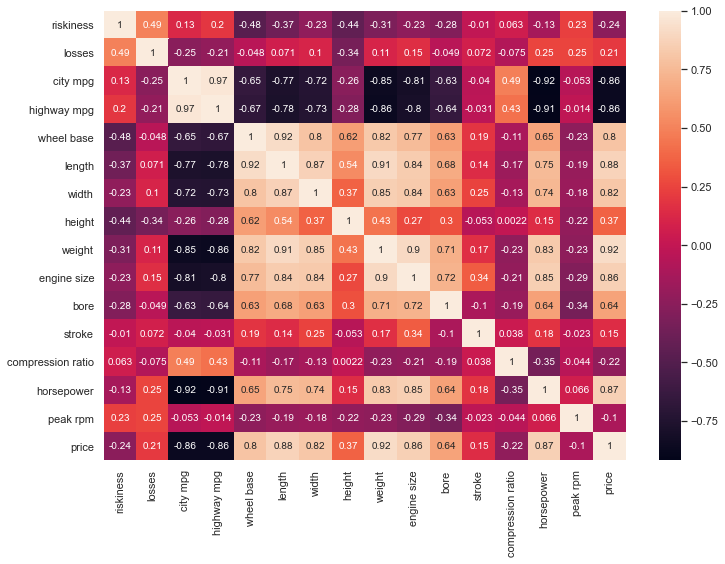

<IPython.core.display.Javascript object>

In [43]:
sns.heatmap(
    df_carros.corr(method="spearman"), annot=True, annot_kws={"size": 10},
)

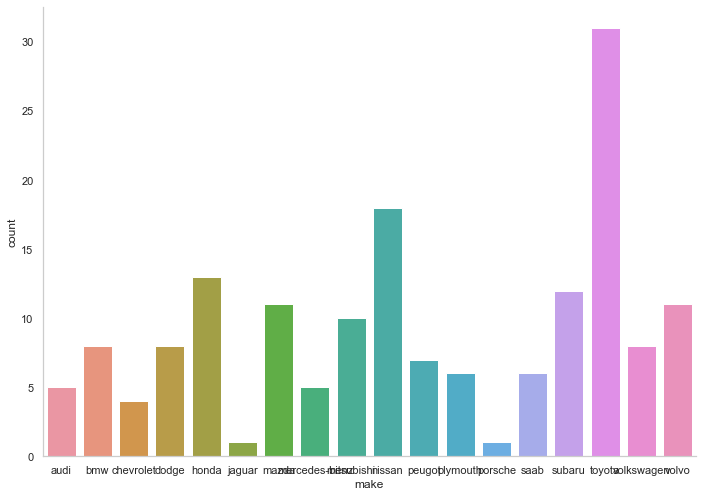

<IPython.core.display.Javascript object>

In [55]:
sns.countplot(x=df_carros["make"])
sns.despine()

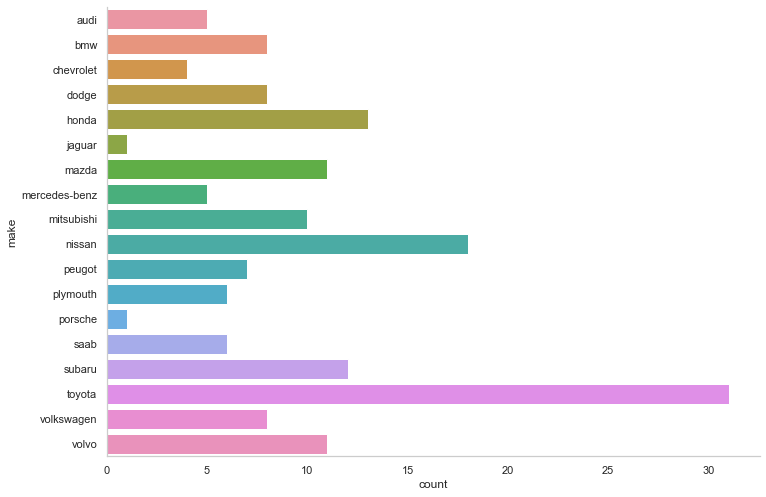

<IPython.core.display.Javascript object>

In [56]:
sns.countplot(y=df_carros["make"])
sns.despine()

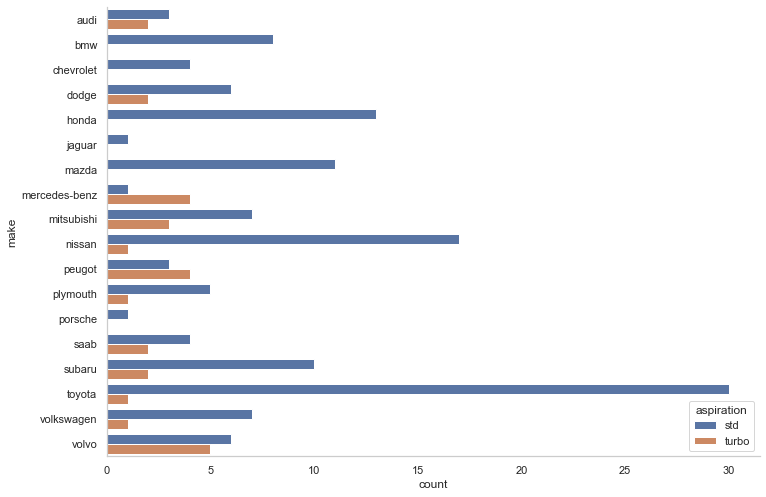

<IPython.core.display.Javascript object>

In [58]:
sns.countplot(data=df_carros, y="make", hue="aspiration")
sns.despine()

In [11]:
pp.ProfileReport(df_carros)

Summarize dataset:   0%|          | 0/40 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>